## License

This notebook is primarily licensed under the MIT License.

Some code cells are based on or adapted from the TensorFlow CycleGAN tutorial,
which is licensed under the Apache License, Version 2.0.

<details>
<summary><strong>License details</strong></summary>

### MIT License

Copyright (c) 2023 AI Course Notebook Contributors

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files to deal in the Software
without restriction, subject to the conditions of the MIT License.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND.

### Third-party code: TensorFlow CycleGAN tutorial

Portions of this notebook are based on or adapted from:

https://github.com/tensorflow/docs-l10n/blob/master/site/ja/tutorials/generative/cyclegan.ipynb

Original copyright:

```text
Copyright 2019 The TensorFlow Authors.
```

The TensorFlow-derived portions are licensed under the Apache License,
Version 2.0.

```text
Licensed under the Apache License, Version 2.0 (the "License");
you may not use those portions except in compliance with the License.
You may obtain a copy of the License at:

https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
```

Modifications to the TensorFlow-derived portions were made by
AI Course Notebook Contributors.

</details>

参考資料：[TensorFlow Core CycleGAN](https://www.tensorflow.org/tutorials/generative/cyclegan?hl=ja)

# CycleGANによる画像変換（条件付き画像生成）
今回のハンズオンは，敵対的生成ネットワーク（Generative Adversarial Networks, GAN）がどのようなものかを体感していただくことが目標です．

## 敵対的生成ネットワーク（GAN）とは
GANは，実在しないデータを生成可能なモデルの一種です．GANは，生成器と識別器を敵対させながら訓練を行うことで，先週のVAEよりも鮮明な画像を生成可能であることで知られています．

GANは，手法にもよりますが，教師なし学習（正解ラベルを必要としない）手法も多いです．つまり，データセットに正解ラベルを付与する作業（アノテーション作業）を省くことができます．


一方，　GANは訓練が不安定になりやすいことでも知られています．
例として，mode collapse（モード崩壊）と呼ばれる現象は，生成器が識別器を簡単に騙すことができるタイプのデータを見つけ，ひたすら同じタイプのデータを生成し続けてしまう現象です．
このようなモデルの訓練失敗を回避するためには，ハイパーパラメータやモデル構成を見直しながら試行錯誤を重ねる必要があります．


## CycleGANとは

本ハンズオンでは，GANの一種である Cycle-Consistent Adversarial Networks を使用して対になっていない画像から画像への変換を行います．Cycle-Consistent Adversarial Networks（周期的構成の敵対的ネットワーク）は，CycleGAN としても知られています．[CycleGANの論文]((https://arxiv.org/abs/1703.10593)では，対になっている訓練用サンプルを使用せずに，画像領域の特性を抽出して，それらの特性を別の画像領域にどのように変換できるのかを見つけ出す方法が提案されています．


CycleGAN では，周期的に一貫した損失を使用して，対になっているデータを必要とせずに訓練することができます．

入力画像と出力画像間において，変換されるべき領域（あるいは変換させない領域）で 1 対 1 のマッピングを行わずに，1 つの領域から別の領域へ変換することができます．
要するに，下記画像の馬-シマウマへ変換する例では，「完全に同じ構図で対となっている馬-シマウマデータの組」「馬/シマウマの領域と背景を判別するマスクデータ」を必要とせずに訓練させることができます．

この方法により，写真補正，カラー画像化，画風変換といったタスクが実行可能となります．これらのタスクに必要となる訓練用データセットは，変換元画像と変換先の画像データセットのみです．

----
［arXiv］[Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks（周期的構成の敵対的ネットワークを使った対となっていない画像から画像への変換）](https://arxiv.org/abs/1703.10593)


![Output Image 1](https://www.tensorflow.org/static/tutorials/generative/images/horse2zebra_1.png?raw=1) ![Output Image 2](https://www.tensorflow.org/static/tutorials/generative/images/horse2zebra_2.png?raw=1)



## GPU の利用確認とTensorFlowのバージョン確認

In [ ]:
!nvidia-smi

Thu Jul  6 00:32:53 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import tensorflow as tf
import sklearn

print('TensorFlow version:',tf.__version__)
print('scikit-learn version:',sklearn.__version__)

if tf.__version__ != '2.12.0':
    !pip install -q --upgrade tensorflow==2.12.0
    print('TensorFlow version:',tf.__version__)

if sklearn.__version__ != '1.2.2':
    !pip install -q --upgrade scikit-learn==1.2.2
    print('scikit-learn version:',sklearn.__version__)

TensorFlow version: 2.12.0
scikit-learn version: 1.2.2


### ライブラリインポート

In [ ]:
import time
import os # os：標準ライブラリ，OS依存の処理（環境変数やフォルダ作成など）を扱う
import datetime # datetime：標準ライブラリ，日付関連データを扱う
import random # random：標準ライブラリ，擬似乱数発生器
import numpy as np # numpy：数値計算用ライブラリの一つ
import pandas as pd # pandas：表計算用ライブラリの一つ
from IPython.display import display # Colabなどで一部のデータをprint()よりも綺麗に出力できる関数
import matplotlib.pylab as plt # matplotlib：グラフ描画用ライブラリの一つ
import seaborn as sns # seaborn：グラフ描画用ライブラリの一つ
import scipy # scipy：数値計算・統計解析用ライブラリの一つ
# tensorboard：深層学習ライブラリTensorFlowのダッシュボード出力用設定
%load_ext tensorboard
import tensorflow as tf # TensorFlow：深層学習ライブラリ一つ

import tensorflow_datasets as tfds # TensorFlowが提供しているデータセット群がまとめられたライブラリ
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
def set_seed(seed=123):
    # hash seed の固定
    os.environ["PYTHONHASHSEED"] = str(seed)
    # Python外部ライブラリ：TensorFlow の ニューラルネットワークを決定論的に動作させる
    os.environ['TF_DETERMINISTIC_OPS'] = 'true'
    # Python外部ライブラリ：TensorFlow の ニューラルネットワークを決定論的に動作させる
    os.environ['TF_CUDNN_DETERMINISTIC'] = 'true'
    # Python標準ライブラリ：random の seed固定
    random.seed(seed)
    # Python外部ライブラリ：Numpy の seed固定
    np.random.seed(seed)
    # Python外部ライブラリ：TensorFlow の seed固定
    tf.random.set_seed(seed)

set_seed(42)

## データセットの取得

今回のハンズオンでは，夏の画像から冬の画像に変換できるようにモデルを訓練します．このデータセット，及びこれに類似したデータセットは，[TensorFlow Datasets（CycleGAN）](https://www.tensorflow.org/datasets/catalog/cycle_gan?hl=ja)にあります．


[論文](https://arxiv.org/abs/1703.10593)に記載されているように，訓練データセットに，ランダムジッタリング（ランダムな平行移動）とミラーリング（左右反転）を適用します．これらは，過学習を避けるための画像認識精度向上テクニックである，データ拡張です．

In [ ]:
dataset, metadata = tfds.load('cycle_gan/summer2winter_yosemite',
                              split={'trainA':'trainA[:20%]','trainB':'trainB[:20%]',
                                     'testA':'testA[:20%]', 'testB':'testB[:20%]'},
                              with_info=True, as_supervised=True)

train_summers, train_winters = dataset['trainA'], dataset['trainB']
test_summers, test_winters = dataset['testA'], dataset['testB']

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Shuffling /root/tensorflow_datasets/cycle_gan/summer2winter_yosemite/2.0.0.incompleteHBRPOI/cycle_gan-trainA.t…

Generating trainB examples...:   0%|          | 0/962 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/summer2winter_yosemite/2.0.0.incompleteHBRPOI/cycle_gan-trainB.t…

Generating testA examples...:   0%|          | 0/309 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/summer2winter_yosemite/2.0.0.incompleteHBRPOI/cycle_gan-testA.tf…

Generating testB examples...:   0%|          | 0/238 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/summer2winter_yosemite/2.0.0.incompleteHBRPOI/cycle_gan-testB.tf…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/summer2winter_yosemite/2.0.0. Subsequent calls will reuse this data.


## データ拡張処理

In [ ]:
# これまでのハンズオン資料ではBATCH_SIZEを128などに設定し，
# データをまとめて処理していました．
# バッチ処理により，計算効率の向上や外れ値（異常値）に対して頑健になるなどの利点があります．
# しかし，CycleGANではBATCH_SIZEを1より大きくすると，精度が下落しやすくなる場合が多いです．

BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 128
BUFFER_SIZE = 10

# 画像のmin-max正規化 [-1, 1]
def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image


def random_jitter(image):
    # モデルへ入力する画像サイズより，少し大きめの画像サイズへリサイズ
    # (IMG_HEIGHT + 30) × (IMG_WIDTH + 30) × 3
    image = tf.image.resize(image, [IMG_HEIGHT + 30, IMG_WIDTH + 30],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    # ランダムにクロッピング：IMG_HEIGHT  × IMG_WIDTH  × 3
    image = tf.image.random_crop(image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

    # ランダムに左右反転
    image = tf.image.random_flip_left_right(image)
    return image


# 訓練用データの前処理
def preprocess_image_train(image, label):
    image = random_jitter(image)
    image = normalize(image)
    return image


# テスト用データの前処理
def preprocess_image_test(image, label):
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH],
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = normalize(image)
    return image



train_summers = train_summers.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_winters = train_winters.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_summers = test_summers.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_winters = test_winters.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)


# サンプル画像データの格納
sample_summer = next(iter(train_summers))
sample_winter = next(iter(train_winters))

## サンプル画像データの可視化

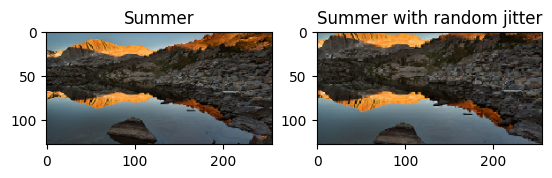

In [ ]:
plt.subplot(121)
plt.title('Summer')
plt.imshow(sample_summer[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Summer with random jitter')
plt.imshow(random_jitter(sample_summer[0]) * 0.5 + 0.5)
plt.show()

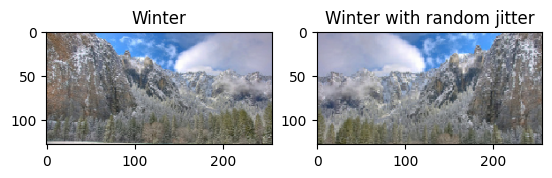

In [ ]:
plt.subplot(121)
plt.title('Winter')
plt.imshow(sample_winter[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Winter with random jitter')
plt.imshow(random_jitter(sample_winter[0]) * 0.5 + 0.5)
plt.show()

## 生成器と識別器のモデルを構築

ここで訓練されるモデルは，以下のような 2 つの生成器/Gnerator（G と F）と 2 つの 識別器/Discriminator（X と Y）です．

- 生成器/Gnerator `G` は，画像 `X` を画像 `Y` に変換する方法を学習します．$(G: X -\gt Y)$
- 生成器/Gnerator `F` は，画像 `Y` を画像 `X` に変換する方法を学習します．$(F: Y -\gt X)$
- 識別器/Discriminator `D_X` は，画像 `X` と生成された画像 `X`（`F(Y)`）を区別する方法を学習します．
- 識別器/Discriminator `D_Y` は，画像 `Y` と生成された画像 `Y`（`G(X)`）を区別する方法を学習します．

![Cyclegan model](https://www.tensorflow.org/static/tutorials/generative/images/cyclegan_model.png?raw=1)

---
<small>[CycleGAN の論文](https://arxiv.org/abs/1703.10593)では，修正 `ResNet` ベースの生成器が使用されています．このハンズオンでは，単純化・高速化するために，修正 `U-net` ベースで層数を削減した生成器を使用しています．
</small>

In [ ]:

# インスタンス正規化
class InstanceNormalization(tf.keras.layers.Layer):
    """Instance Normalization Layer (https://arxiv.org/abs/1607.08022)."""

    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)

        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, kernel_size, strides, norm_type='batchnorm', apply_norm=True):
    """Downsamples an input.
    Conv2D => Batchnorm => LeakyRelu
    Args:
        filters: number of filters
        size: filter size
        norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
        apply_norm: If True, adds the batchnorm layer
    Returns:
        Downsample Sequential Model
    """
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters=filters,
                                kernel_size=kernel_size,
                                strides=strides,
                                padding='same',
                                kernel_initializer=initializer, use_bias=False))

    if apply_norm:
        if norm_type.lower() == 'batchnorm':
            result.add(tf.keras.layers.BatchNormalization())
        elif norm_type.lower() == 'instancenorm':
            result.add(InstanceNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result


def upsample(filters, kernel_size, strides, norm_type='batchnorm', apply_dropout=False):
    """Upsamples an input.
    Conv2DTranspose => Batchnorm => Dropout => Relu
    Args:
        filters: number of filters
        size: filter size
        norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
        apply_dropout: If True, adds the dropout layer
    Returns:
        Upsample Sequential Model
    """

    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters = filters,
                                        kernel_size = kernel_size,
                                        strides=strides,
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result


def unet_generator(output_channels, norm_type='batchnorm'):
    """Modified u-net generator model (https://arxiv.org/abs/1611.07004).
    Args:
        output_channels: Output channels
        norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
    Returns:
        Generator model
    """

    down_stack = [
        downsample(filters=64, kernel_size = 4, strides=2, norm_type=norm_type, apply_norm=False),
        downsample(filters=128, kernel_size =4, strides=2, norm_type=norm_type),
        downsample(filters=256, kernel_size =4, strides=2, norm_type=norm_type),
        downsample(filters=512, kernel_size =4, strides=2, norm_type=norm_type),
        downsample(filters=512, kernel_size =4, strides=2, norm_type=norm_type),
        downsample(filters=512, kernel_size =4, strides=2, norm_type=norm_type),
    ]

    up_stack = [
        upsample(filters=512, kernel_size=4, strides=2, norm_type=norm_type, apply_dropout=True),
        upsample(filters=512, kernel_size=4, strides=2, norm_type=norm_type),
        upsample(filters=256, kernel_size=4, strides=2, norm_type=norm_type),
        upsample(filters=128, kernel_size=4, strides=2, norm_type=norm_type),
        upsample(filters=64, kernel_size=4, strides=2, norm_type=norm_type),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(
        filters=output_channels, kernel_size=4, strides=2,
        padding='same', kernel_initializer=initializer,
        activation='tanh')

    concat = tf.keras.layers.Concatenate()

    inputs = tf.keras.layers.Input(shape=[None, None, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


def discriminator(norm_type='batchnorm', target=True):
    """PatchGan discriminator model (https://arxiv.org/abs/1611.07004).
    Args:
        norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
        target: Bool, indicating whether target image is an input or not.
    Returns:
        Discriminator model
    """

    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
    x = inp

    if target:
        tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
        x = tf.keras.layers.concatenate([inp, tar])

    down1 = downsample(filters=64, kernel_size=4, strides=2, norm_type=norm_type, apply_norm=False)(x)
    down2 = downsample(filters=128, kernel_size=4, strides=2, norm_type=norm_type)(down1)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2)
    conv = tf.keras.layers.Conv2D(
        filters=256,
        kernel_size=4, strides=1, kernel_initializer=initializer,
        use_bias=False)(zero_pad1)

    if norm_type.lower() == 'batchnorm':
        norm1 = tf.keras.layers.BatchNormalization()(conv)
    elif norm_type.lower() == 'instancenorm':
        norm1 = InstanceNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

    last = tf.keras.layers.Conv2D(
        filters=1, kernel_size=4, strides=1,
        kernel_initializer=initializer)(zero_pad2)

    if target:
        return tf.keras.Model(inputs=[inp, tar], outputs=last)
    else:
        return tf.keras.Model(inputs=inp, outputs=last)



OUTPUT_CHANNELS = 3

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)


tf.keras.utils.plot_model(generator_g, to_file='generator_g.jpg')
tf.keras.utils.plot_model(generator_f, to_file='generator_f.jpg')
tf.keras.utils.plot_model(discriminator_x, to_file='discriminator_x.jpg')
tf.keras.utils.plot_model(discriminator_y, to_file='discriminator_y.jpg')
print('モデル構造は画像で出力されます，左側のメニューから確認してください．')

モデル構造は画像で出力されます，左側のメニューから確認してください．


## 未訓練状態の生成器による画像変換

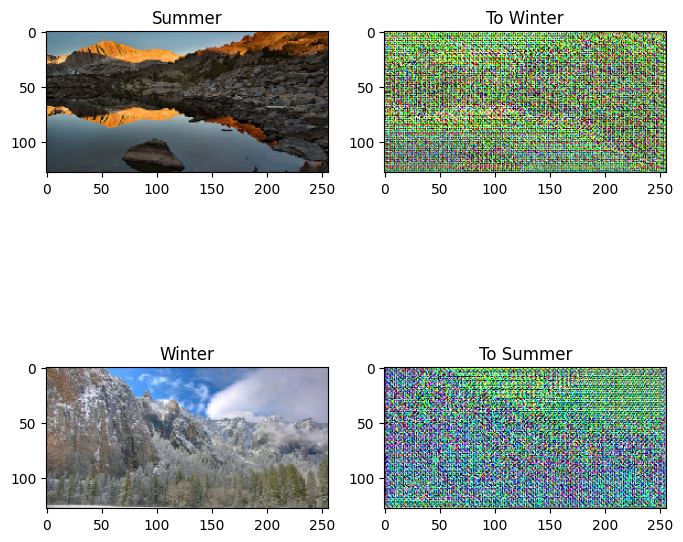

In [ ]:
to_winter = generator_g(sample_summer)
to_summer = generator_f(sample_winter)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_summer, to_winter, sample_winter, to_summer]
title = ['Summer', 'To Winter', 'Winter', 'To Summer']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(((imgs[i][0] * 0.5 + 0.5) * 255).numpy().astype(np.uint8))
    else:
        plt.imshow( np.clip(((imgs[i][0] * 0.5 * contrast + 0.5)*255).numpy(), 0, 255).astype(np.uint8))
plt.show()

## CycleGAN の損失関数

識別器の損失と，生成器の損失を定義します．

CycleGAN では，訓練可能な対になったデータが存在しないため，訓練中の入力 `x` とターゲット `y` のペアに意味がある保証はありません．

したがって，ネットワークによる的確なマッピングを強化するために，論文の執筆者は 「周期的に一貫性のある損失」を提案しています．


周期的一貫性とは，結果が元の入力に近いことを指します．たとえば，ある文を英語からフランス語に翻訳してから，フランス語から英語に戻す場合，結果として得られる文は元の文と同じになるということです．

周期的一貫性損失は，以下のように行われます．

- 画像 $X$ はジェネレータ $G$ を介して渡され，画像 $\hat{Y}$ を生成します．
- 生成された画像 $\hat{Y}$ はジェネレータ $F$ を介して渡され，周期後の画像 $\hat{X}$ を生成します．
- $X$ と $\hat{X}$ 間の平均絶対誤差が計算されます．

$$ forward\ cycle\ consistency\ loss: X -\gt G(X) -\gt F(G(X)) \sim \hat{X} $$


$$ backward\ cycle\ consistency\ loss: Y -\gt F(Y) -\gt G(F(Y)) \sim \hat{Y} $$

![Cycle loss](https://www.tensorflow.org/static/tutorials/generative/images/cycle_loss.png?raw=1)

上記に示す通り，画像 $X$ から画像 $Y$ への変換は，生成器 $G$ が行います．

アイデンティティ損失は，画像 $Y$ を生成器 $G$ に与えた場合，実際の $Y$ または画像 $Y$ に近い画像を生成すると記述できます．

夏の画像に対して「冬から夏モデル」を実行する，あるいは，冬の画像に対して「夏から冬モデル」を実行する場合，画像は殆ど変更されません．

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [ ]:
# LAMBDA（λ）： cycle_loss と identity_loss の重みを調整する正則化係数
# 訓練画像によって最適な値が異なるが，一般に，
# 小さ過ぎると画質が粗くなるが，大き過ぎると入力と同じ出力を返す（恒等写像）ようになる．
# どちらにせよ訓練失敗となるため，最適な値の探索が必要となる．

LAMBDA = 0.1

loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)

    generated_loss = loss_obj(tf.zeros_like(generated), generated)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)


def calc_cycle_loss(real_image, cycled_image):

    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1


def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss


# すべての生成期と識別器のオプティマイザを初期化
generator_g_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)

## 生成器と識別器の訓練

**このハンズオン資料は授業時間で実行するために，「短時間の訓練でそこそこの画像を生成する」ための調整となっています．**

* 元々のデータセットの20%のみを使用して訓練しています．
* 生成器および識別器の層数を削減しています．
* 論文（Epoch：200 回）よりも，少ないEpoch数（Epoch：10）で訓練しています．
* 論文（学習率：2e-4）よりも，大きい学習率（学習率：2e-3）で訓練しています．
* 論文（正則化係数lambda：10）よりも大幅に小さい正則化係数（正則化係数lambda：0.1）で訓練しています．

訓練を行うコードセルは，以下の 4 つの基本ループで構成されています．

1. 予測を取得する．
2. 損失を計算する．
3. 誤差逆伝播法を使用して勾配を計算する．
4. 勾配をオプティマイザに適用する．

....................

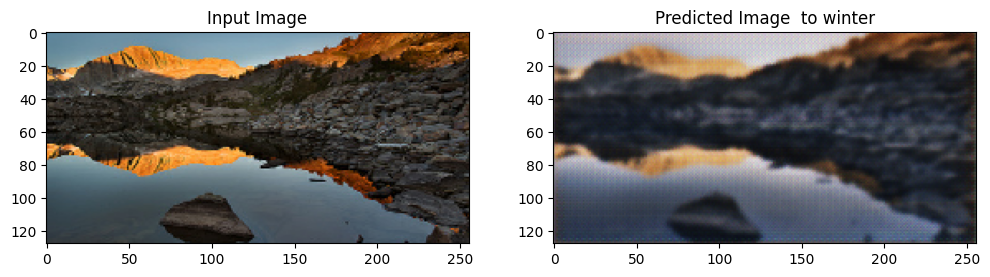

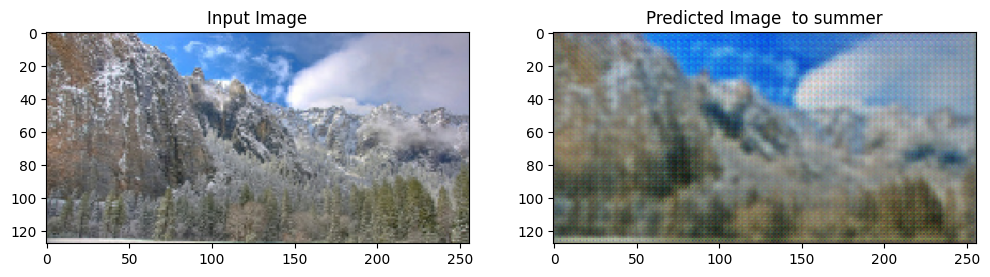

Time taken for epoch 1 is 115.98451089859009 sec

....................

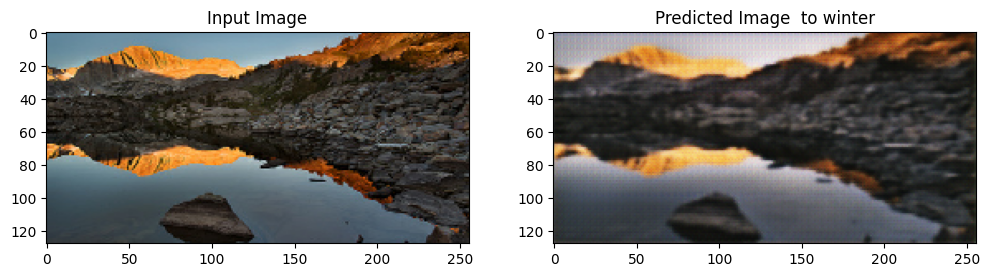

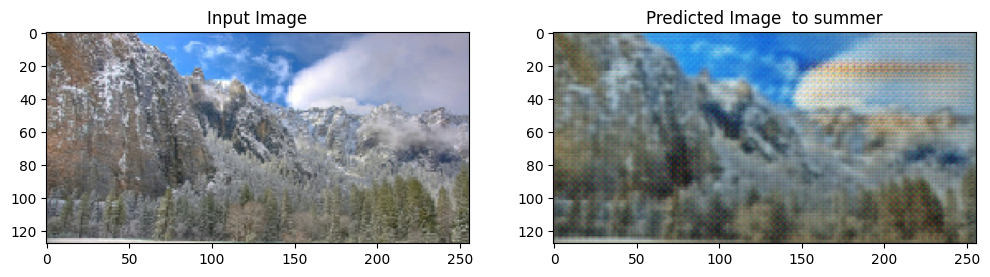

Time taken for epoch 2 is 85.68791842460632 sec

....................

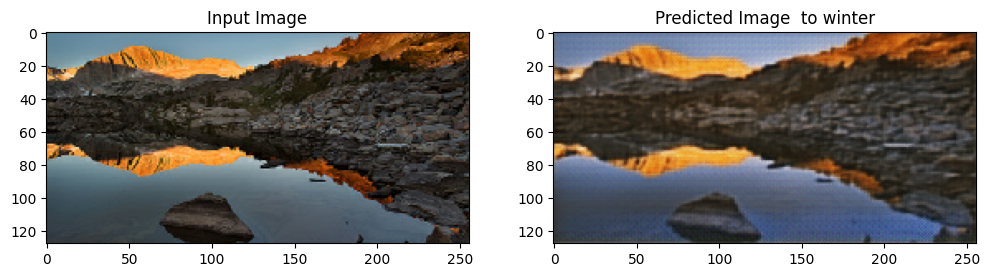

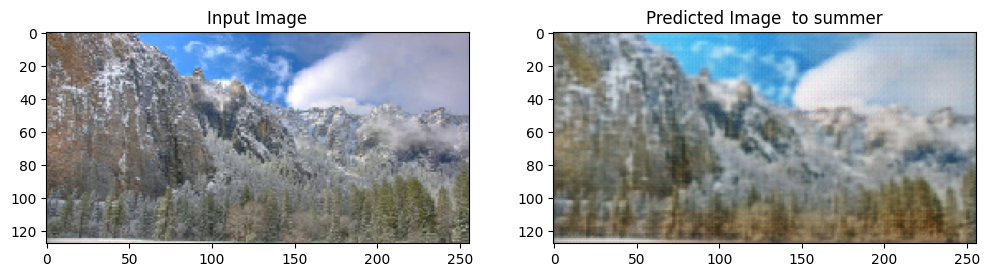

Time taken for epoch 3 is 85.63794803619385 sec

....................

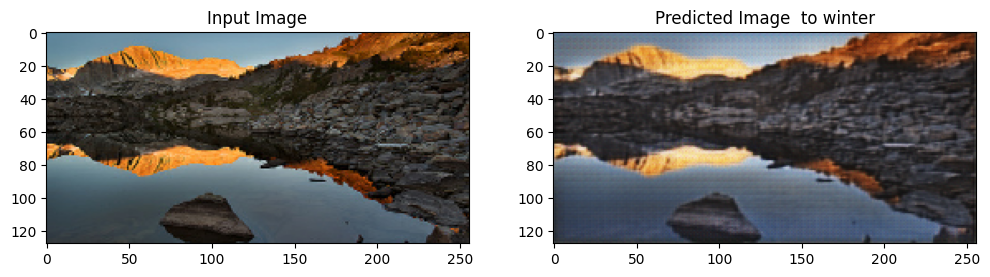

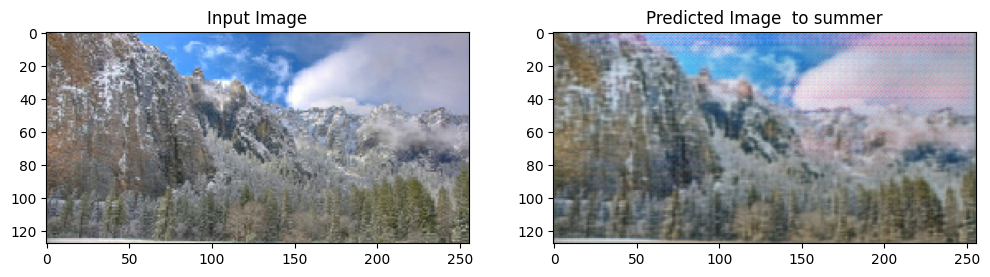

Time taken for epoch 4 is 85.58957576751709 sec

....................

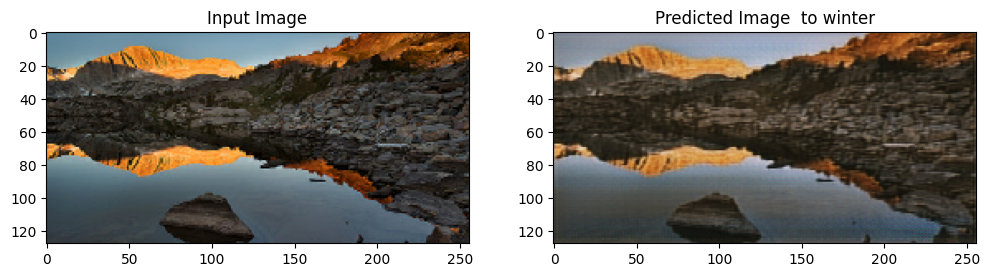

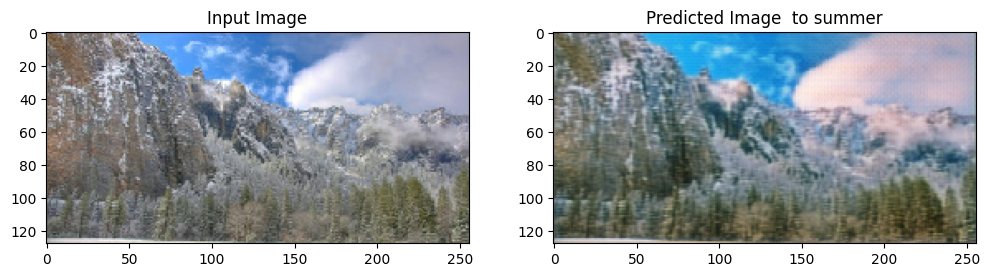

Time taken for epoch 5 is 85.55416774749756 sec

....................

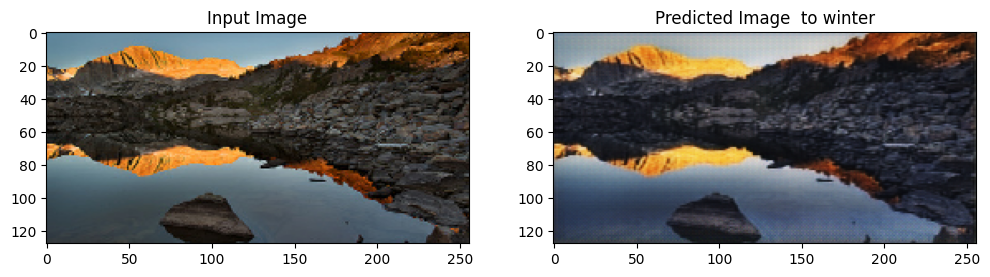

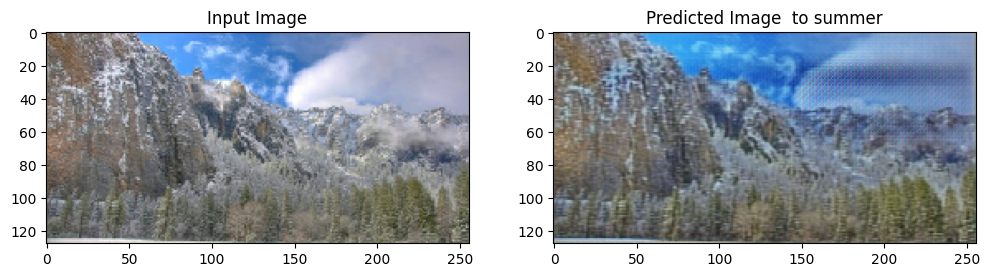

Time taken for epoch 6 is 85.56928515434265 sec

....................

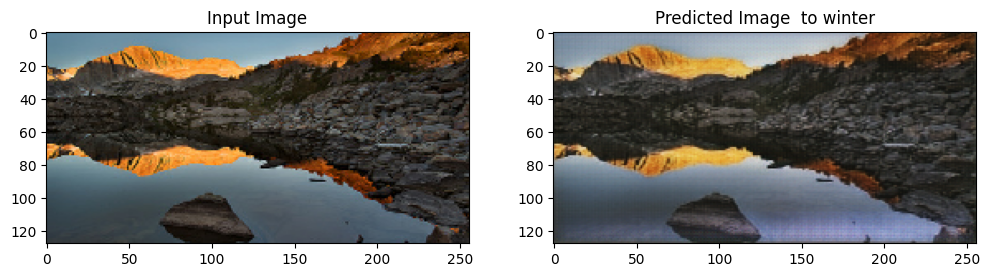

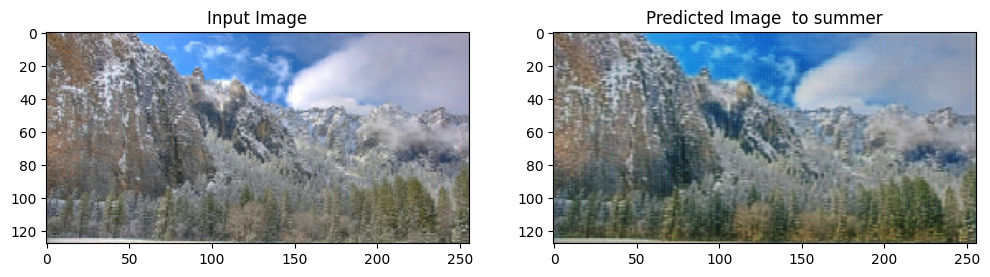

Time taken for epoch 7 is 85.61274933815002 sec

....................

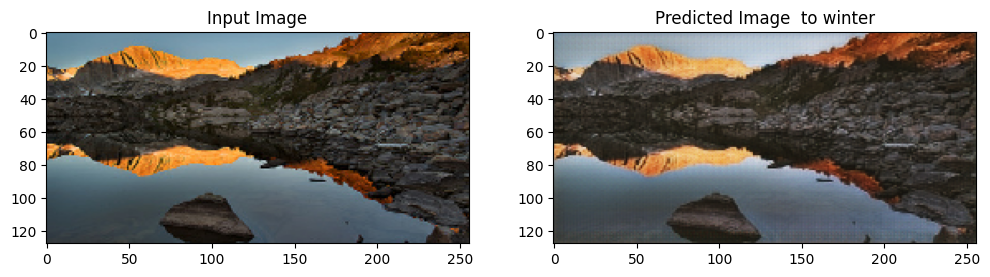

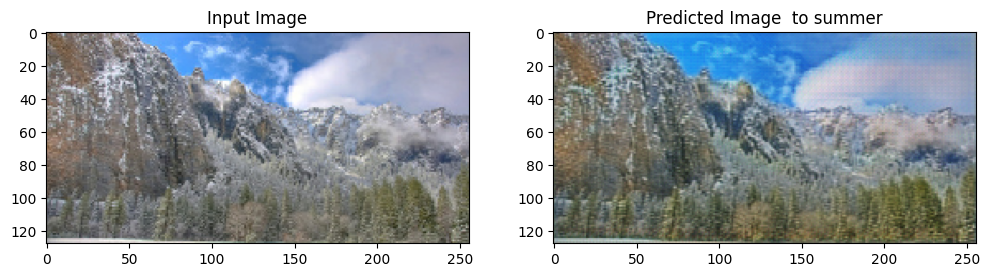

Time taken for epoch 8 is 85.57100296020508 sec

....................

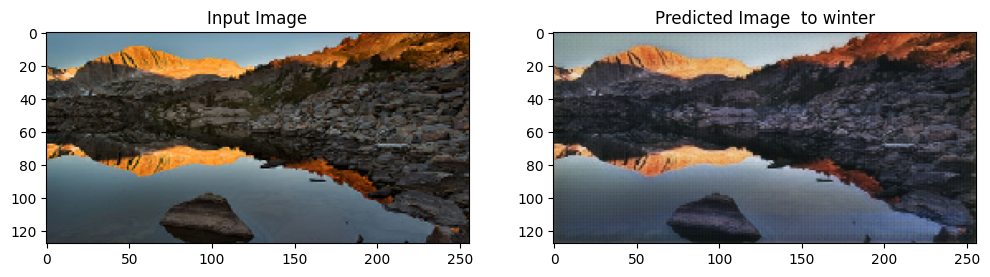

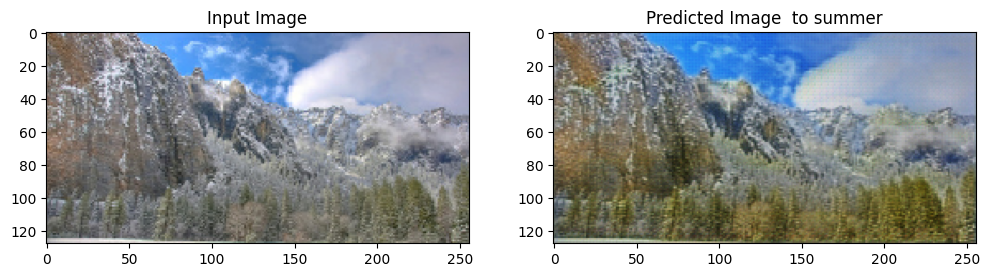

Time taken for epoch 9 is 85.55557870864868 sec

....................

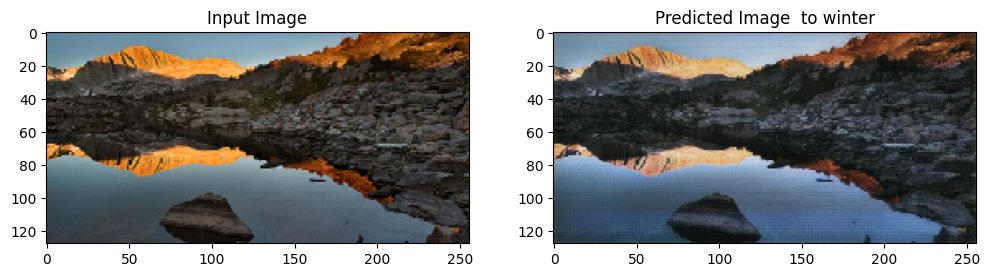

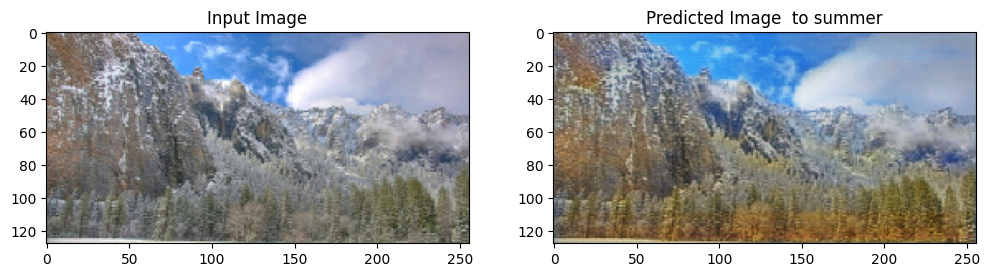

Time taken for epoch 10 is 85.62275123596191 sec



In [ ]:
# Epoch数の設定
EPOCHS = 10

def generate_images(model, test_input, translates_type=''):
    prediction = model(test_input)

    plt.figure(figsize=(12, 12))

    plt.subplot(121)
    plt.imshow( ((test_input[0]*0.5+0.5) * 255).numpy().astype(np.uint8) )
    plt.title('Input Image')


    plt.subplot(122)
    plt.imshow( ((prediction[0]*0.5+0.5) * 255).numpy().astype(np.uint8) )
    plt.title(f'Predicted Image  {translates_type}')
    plt.show()



@tf.function
def train_step(real_x, real_y):

    # 勾配計算
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.

        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x と same_y は identity loss.計算に使用する
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # 生成器の損失を計算
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # 生成器と識別器の勾配を計算
    generator_g_gradients = tape.gradient(total_gen_g_loss,
                                            generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss,
                                            generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss,
                                                discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss,
                                                discriminator_y.trainable_variables)

    # 最適化アルゴリズムに勾配を適用
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                                generator_g.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                                generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                    discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                    discriminator_y.trainable_variables))




for epoch in range(EPOCHS):
    start = time.time()

    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_summers, train_winters)):
        train_step(image_x, image_y)
        if n % 10 == 0:
            print ('.', end='')
        n += 1

    # 画像生成
    generate_images(generator_g, sample_summer, 'to winter')
    generate_images(generator_f, sample_winter, 'to summer')

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

## テストデータセットを使用して画像生成を行う

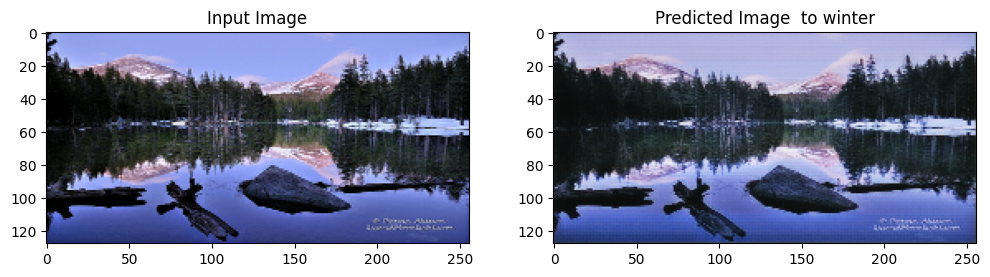

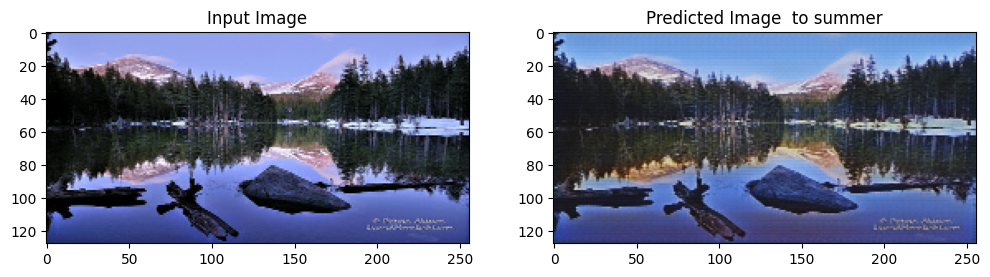

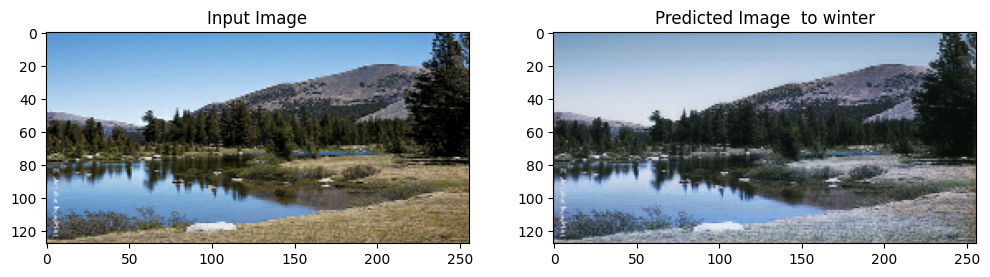

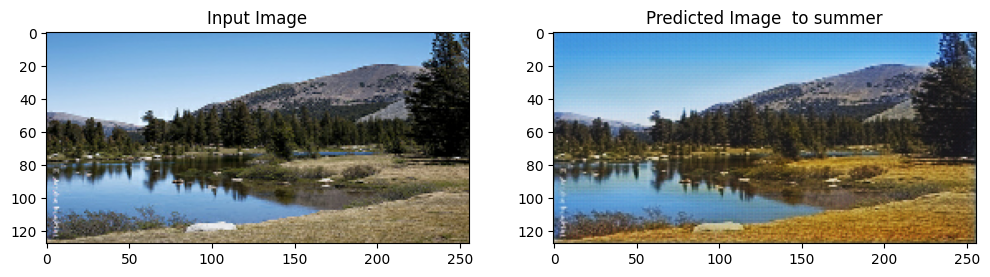

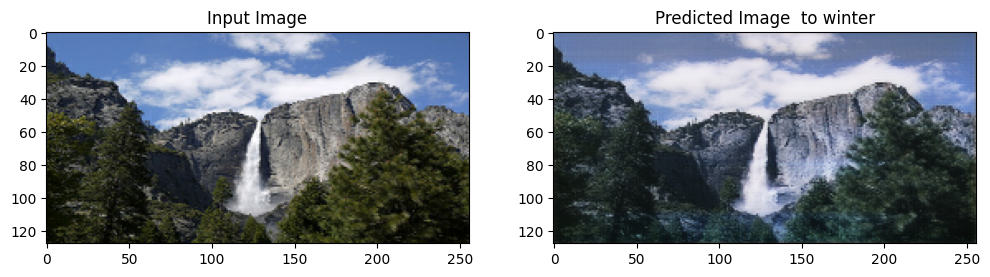

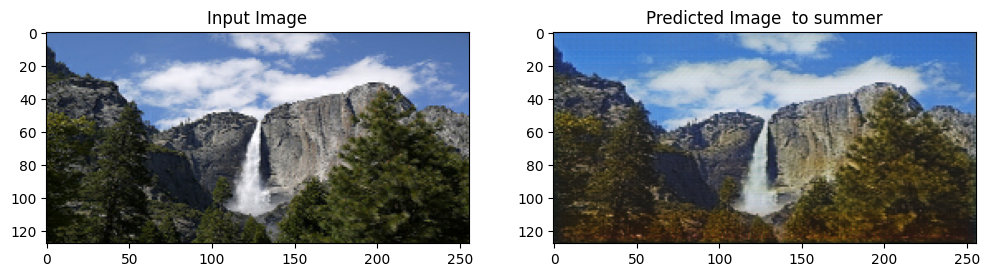

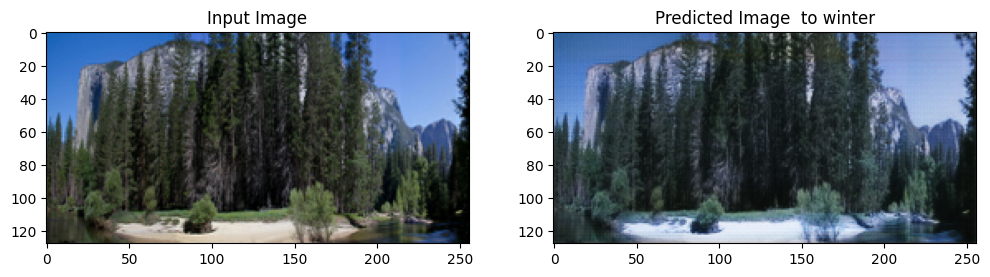

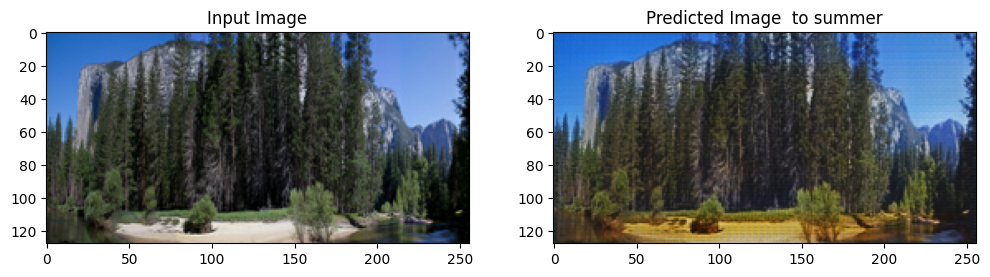

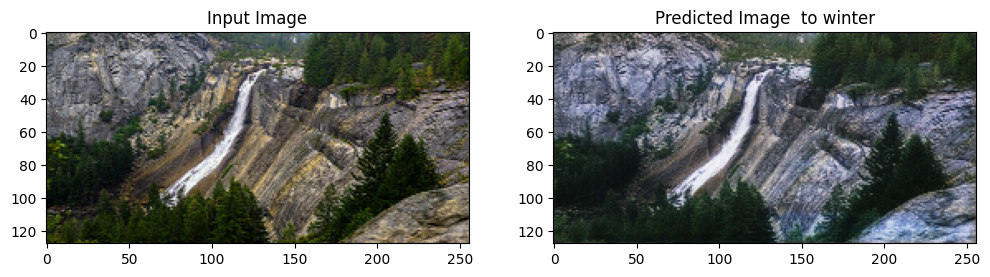

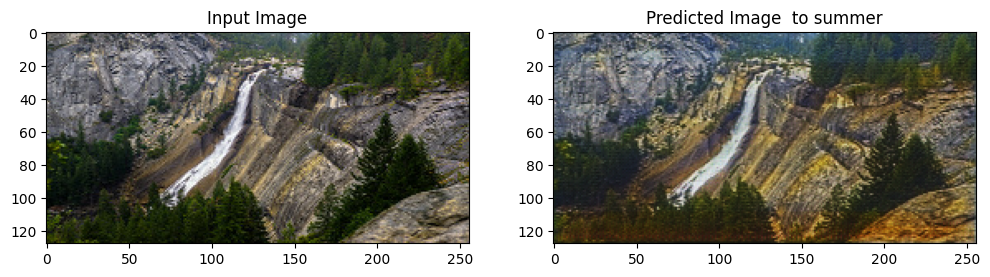

In [ ]:
# 訓練済の生成器で画像生成を行う
for inp in test_summers.take(5):
    generate_images(generator_g, inp, 'to winter')
    generate_images(generator_f, inp, 'to summer')


## 訓練後の生成器による画像変換

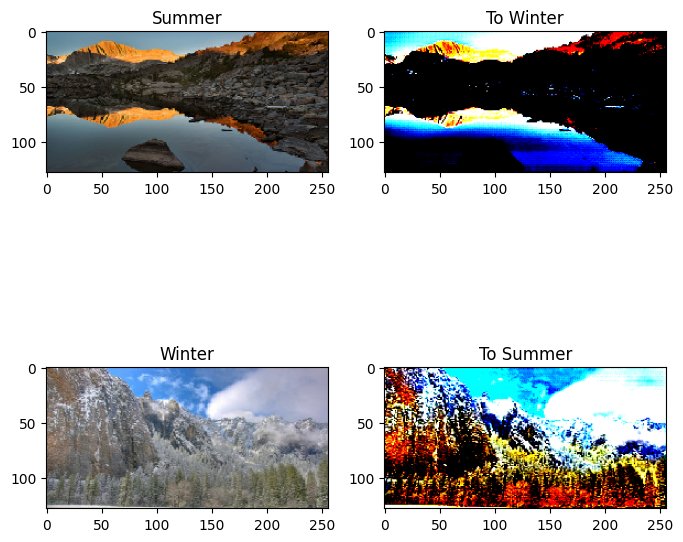

In [ ]:
to_winter = generator_g(sample_summer)
to_summer = generator_f(sample_winter)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_summer, to_winter, sample_winter, to_summer]
title = ['Summer', 'To Winter', 'Winter', 'To Summer']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(((imgs[i][0] * 0.5 + 0.5)*255).numpy().astype(np.uint8))
    else:
        plt.imshow( np.clip(((imgs[i][0] * 0.5 * contrast + 0.5)*255).numpy(), 0, 255).astype(np.uint8))
plt.show()